In [1]:
import cv2 
import numpy as np
import matplotlib.pyplot as plt

## Q1
### Part 1

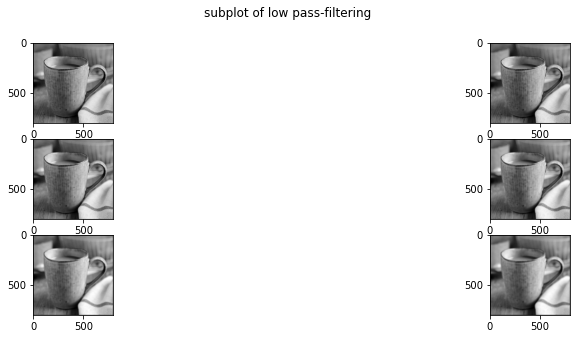

In [109]:
img1 = cv2.imread("../images/ceramic.jpg")
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)

def apply_fil(img,k):
    num = (1/(k*k))
    h,w = img.shape
    padded = np.zeros((h+k-1,w+k-1),dtype = 'int')
    mid = k//2
    padded[mid:h+mid,mid:w+mid] = img
    output = np.zeros((h,w))
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            val = 0
            for o in range(k):
                for l in range(k):
                    val +=  padded[i + o,j + l]*num
                    
            output[i][j] = val
    return output

out = apply_fil(img1,3)
out2 = apply_fil(img1,5)
out3 = apply_fil(img1,7)
out4 = apply_fil(img1,11)
out5 = apply_fil(img1,13)
fig, ((ax1, ax2),(ax3,ax4),(ax5,ax6)) = plt.subplots(3, 2,figsize=(15, 10))
fig.suptitle('subplot of low pass-filtering')
ax1.imshow(img1,cmap="gray")
ax2.imshow(out,cmap="gray")
ax3.imshow(out2,cmap="gray")
ax4.imshow(out3,cmap="gray")
ax5.imshow(out4,cmap="gray")
ax6.imshow(out5,cmap="gray")


### Part 2

In [12]:
def efficientAverageFilter(img, k):
    kSqr = k ** 2
    kby2 = int(k / 2)
    # Padding image
    img3 = np.zeros((img.shape[0] + 2 * kby2, img.shape[1] + 2 * kby2))
    img3[kby2:img3.shape[0] - kby2, kby2:img3.shape[1] - kby2] = img

    # Finding prefix arrays
    prefixRows = []
    for r in range(len(img3)):
        prefixRows.append(img3[r].cumsum())

    prefixCols = []
    img3 = img3.T
    for r in range(len(img3)):
        prefixCols.append(img3[r].cumsum())

    img3 = img3.T.astype('float')
    # Filter value of first top leftmost block
    img3[kby2][kby2] = np.sum(img3[0:k,0:k]) / kSqr
    # Apllying average filter on other pixels
    for r in range(kby2, img3.shape[0] - kby2):
        for c in range(kby2, img3.shape[1] - kby2):
            if r == kby2 and c == kby2:
                continue
            if c == kby2:
                img3[r][c] = (img3[r - 1][c] * kSqr + prefixRows[r + kby2][k - 1] - prefixRows[r - kby2 - 1][k - 1]) / kSqr
                continue
            if r == kby2:
                img3[r][c] = (img3[r][c - 1] * kSqr + prefixCols[c + kby2][r + kby2] - prefixCols[c - kby2 - 1][r + kby2]) / kSqr
                continue
            img3[r][c] = (img3[r][c - 1] * kSqr + prefixCols[c + kby2][r + kby2] - prefixCols[c + kby2][r - kby2 - 1] - prefixCols[c - kby2 - 1][r + kby2] + prefixCols[c - kby2 - 1][r - kby2 - 1]) / kSqr
    # Removing padded region and returning
    return np.rint(img3[kby2:img3.shape[0] - kby2, kby2:img3.shape[1] - kby2]).astype('uint8')



### Part 3

'Efficient Average for img size = 512 and k = 15 done'

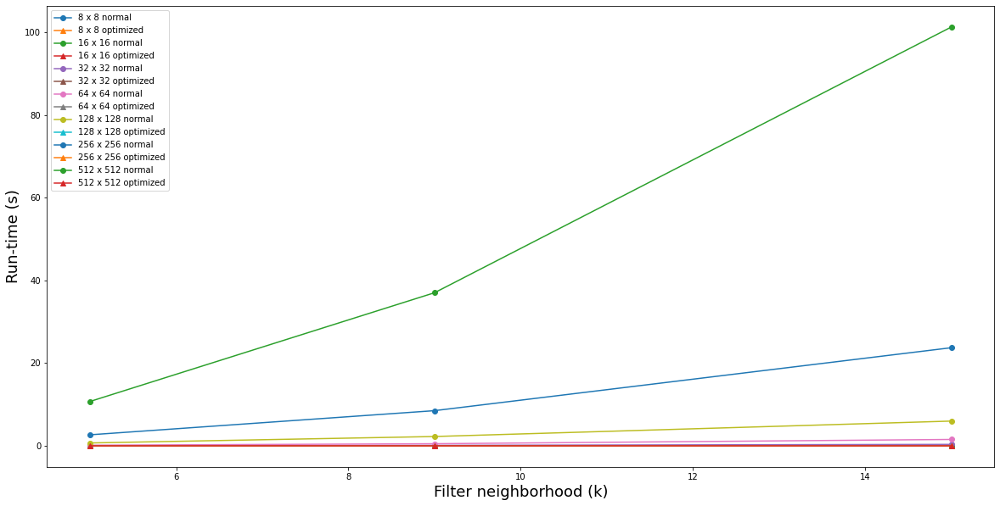

In [105]:
# For dynamic printing
from IPython.display import clear_output, display
from timeit import timeit
img = cv2.imread("../images/ceramic.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

image_sizes = [8,16,32,64, 128, 256, 512]
k_values = [5, 9, 15]

plt.figure(figsize=(20, 10))
for cur_size in range(len(image_sizes)):
    # resize ceramic
    img = cv2.resize(img, (image_sizes[cur_size],image_sizes[cur_size])) 
    yC = [[], []]
    for k in k_values:
        s = timeit('apply_fil(img, k)', setup='from __main__ import apply_fil, img, k', number=2)
        clear_output(wait=True)
        display("Normal Average for img size = " + str(image_sizes[cur_size]) + " and k = " + str(k) + " done")
        yC[0].append(s / 2)
        s = timeit('efficientAverageFilter(img, k)', setup='from __main__ import efficientAverageFilter, img, k', number=2)
        clear_output(wait=True)
        display("Efficient Average for img size = " + str(image_sizes[cur_size]) + " and k = " + str(k) + " done")
        yC[1].append(s / 2)
    plt.plot(k_values, yC[0], label=str(image_sizes[cur_size]) + " x " + str(image_sizes[cur_size]) + " normal", marker='o')
    plt.plot(k_values, yC[1], label=str(image_sizes[cur_size]) + " x " + str(image_sizes[cur_size]) + " optimized", marker='^')

print()
plt.xlabel('Filter neighborhood (k)', fontsize=18)
plt.ylabel('Run-time (s)', fontsize=18)
plt.legend()

### Part 4

In [106]:
def medianFilter(img, k):
    kby2 = int(k / 2)
    # Padding image
    img3 = np.zeros((img.shape[0] + 2 * kby2, img.shape[1] + 2 * kby2))
    img3[kby2:img3.shape[0] - kby2, kby2:img3.shape[1] - kby2] = img
    result = img3.copy()
    # Applying convolution
    for r in range(kby2, img3.shape[0] - kby2):
        for c in range(kby2, img3.shape[1] - kby2):
            median = img3[r - kby2:r + kby2 + 1,c - kby2:c + kby2 + 1].flatten()
            median.sort()
            median = median[(k * k) // 2]
            result[r][c] = np.rint(median)
    return np.rint(result[kby2:img3.shape[0] - kby2, kby2:img3.shape[1] - kby2]).astype('uint8')


def getMedian(arr):
    # Find position of mid element
    midElement = 1
    for el in arr:
        midElement += el
    midElement = int(midElement / 2)

    # Find prefix sum untill u get the element with prefix sum > mid
    s = 0
    for i in range(256):
        s += arr[i]
        if s >= midElement:
            return i

    # Incase of any error
    print('Some Error Occurred')
    return None

# Efficient median filter
def efficientMedianFilter(img, k):
    kby2 = int(k / 2)
    # Padding image
    img3 = np.zeros((img.shape[0] + 2 * kby2, img.shape[1] + 2 * kby2)).astype('uint8')
    img3[kby2:img3.shape[0] - kby2, kby2:img3.shape[1] - kby2] = img
    img2 = img3.copy()
    # 256 sized pixel count array
    pixelCnt = np.zeros(256, dtype=int)
    for r in range(k):
        for c in range(k):
            pixelCnt[img3[r][c]] += 1
    prevPixelArr = pixelCnt.copy()
    # Filter value of first top leftmost block
    img2[kby2][kby2] = getMedian(pixelCnt)
    # Applying convolution
    for r in range(kby2, img3.shape[0] - kby2):
        for c in range(kby2, img3.shape[1] - kby2):
            if r == kby2 and c == kby2:
                continue
            if c == kby2:
                # Add new pixels
                for i in img3[r + kby2:r + kby2 + 1, c - kby2:c + kby2 + 1][0]:
                    prevPixelArr[i] += 1
                # Remove pixels that went out of the frame
                for i in img3[r - kby2 - 1:r - kby2, c - kby2:c + kby2 + 1][0]:
                    prevPixelArr[i] -= 1
                img2[r][c] = getMedian(prevPixelArr)
                pixelCnt = prevPixelArr.copy()
                continue
                # Add new pixels
            for i in img3[r - kby2:r + kby2 + 1, c + kby2:c + kby2 + 1].reshape((1, k))[0]:
                pixelCnt[i] += 1
            # Remove pixels that went out of the frame
            for i in img3[r - kby2:r + kby2 + 1, c - kby2 - 1:c - kby2].reshape((1, k))[0]:
                pixelCnt[i] -= 1
            img2[r][c] = getMedian(pixelCnt)
    return np.rint(img2[kby2:img2.shape[0] - kby2, kby2:img2.shape[1] - kby2]).astype('uint8')



'Efficient Median for img size = 128 and k = 93 done'

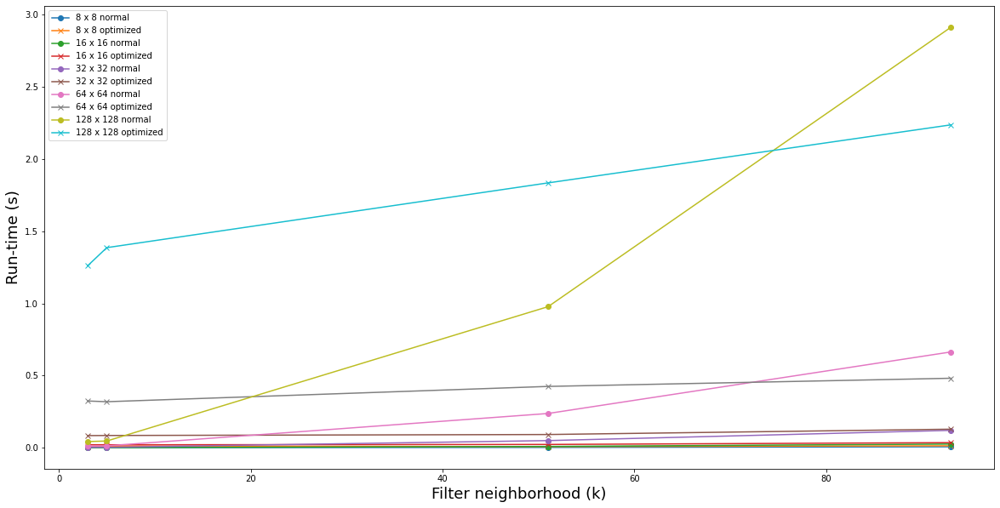

In [91]:
image_sizes = [8,16,32,64, 128]
k_values = [3,5,51,93]
img = cv2.imread("../images/ceramic.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.figure(figsize=(20, 10))
for cur_size in range(len(image_sizes)):

    img = cv2.resize(img, (image_sizes[cur_size],image_sizes[cur_size])) 
    yC = [[], []]
    for k in k_values:
        s = timeit('medianFilter(img, k)', setup='from __main__ import medianFilter, img, k', number=2)
        clear_output(wait=True)
        display("Normal Median for img size = " + str(image_sizes[cur_size]) + " and k = " + str(k) + " done")
        yC[0].append(s / 2)
        s = timeit('efficientMedianFilter(img, k)', setup='from __main__ import efficientMedianFilter, img, k', number=2)
        clear_output(wait=True)
        display("Efficient Median for img size = " + str(image_sizes[cur_size]) + " and k = " + str(k) + " done")
        yC[1].append(s / 2)
    plt.plot(k_values, yC[0], label=str(image_sizes[cur_size]) + " x " + str(image_sizes[cur_size]) + " normal", marker='o')
    plt.plot(k_values, yC[1], label=str(image_sizes[cur_size]) + " x " + str(image_sizes[cur_size]) + " optimized", marker='x')

print()
plt.xlabel('Filter neighborhood (k)', fontsize=18)
plt.ylabel('Run-time (s)', fontsize=18)
plt.legend()

### Part 5

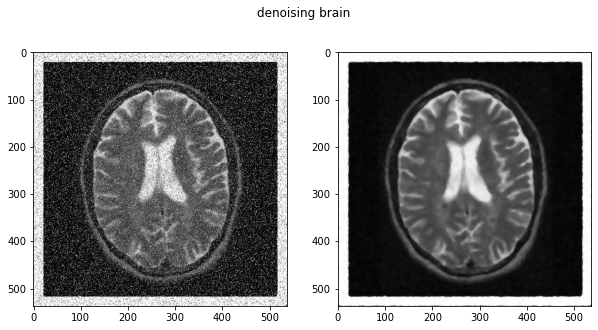

In [53]:
brain = cv2.imread("../images/brainNoisy.jpg")
brain = cv2.cvtColor(brain, cv2.COLOR_BGR2GRAY)

clean = efficientMedianFilter(brain,7)
fig, ((ax1, ax2)) = plt.subplots(1, 2,figsize=(10, 5))
fig.suptitle('denoising brain')
ax1.imshow(brain ,cmap= "gray")
ax2.imshow(clean ,cmap= "gray")

- Median filter is the best to remove salt and pepper noise
- Experimented with different filter sizes and and found that 7 * 7 size kernel performs the best and resembles original photo the most. 

## Q2
### Part 1

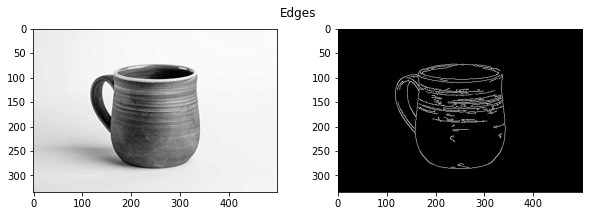

In [48]:
cup = cv2.imread("../images/cup.jpg")
cup = cv2.cvtColor(cup, cv2.COLOR_BGR2GRAY)

edges = cv2.Canny(image=cup, threshold1=100, threshold2=250)
fig, ((ax1, ax2)) = plt.subplots(1, 2,figsize=(10, 3))
fig.suptitle('Edges')
ax1.imshow(cup ,cmap= "gray")
ax2.imshow(edges ,cmap= "gray")

### Part 2 

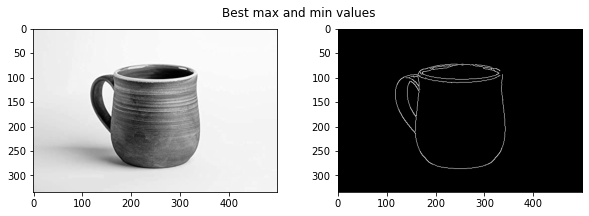

In [47]:
edges = cv2.Canny(image=cup, threshold1=100, threshold2=650)
fig, ((ax1, ax2)) = plt.subplots(1, 2,figsize=(10, 3))
fig.suptitle('Best max and min values')
ax1.imshow(cup ,cmap= "gray")
ax2.imshow(edges ,cmap= "gray")

- Best Values turn out to be 
` min = 100 ` and `Max = 650`

### Part 3

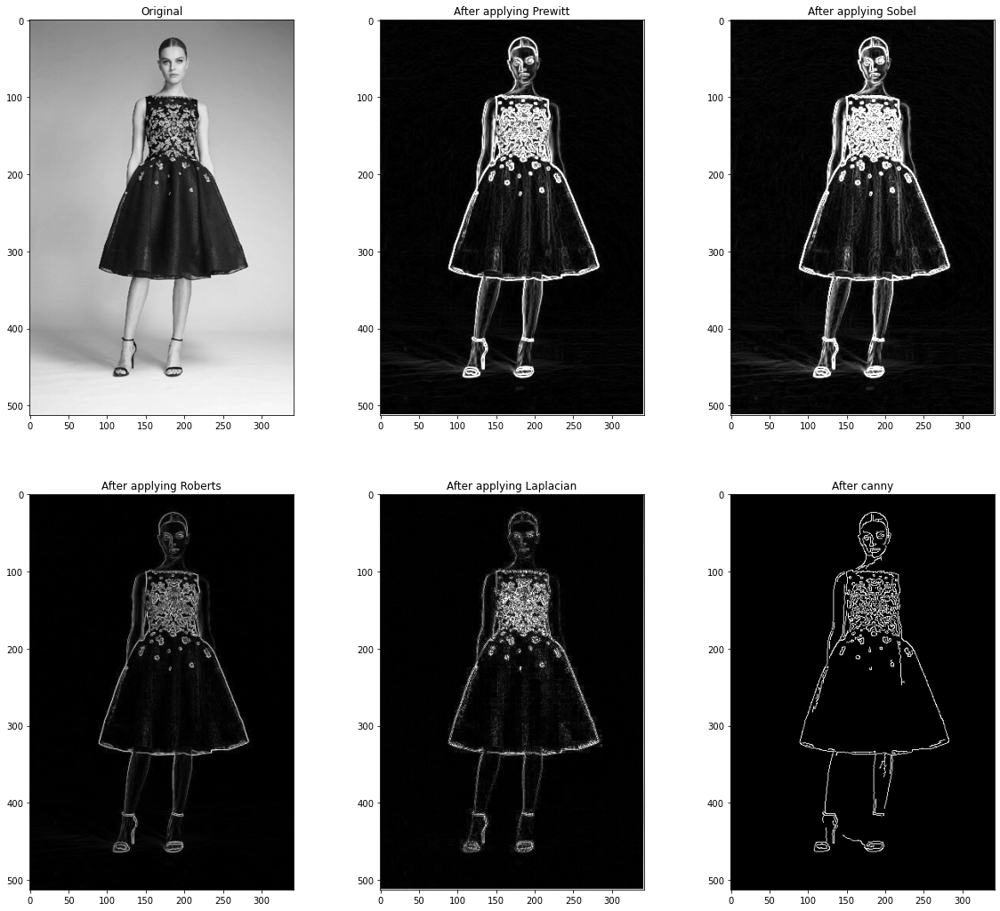

In [23]:
def apply_filter(img,k,fil):
    h,w = img.shape
    padded = np.zeros((h+k-1,w+k-1),dtype = 'int')
    mid = k//2
    padded[mid:h+mid,mid:w+mid] = img
    output = np.zeros((h,w))
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            val = 0
            for o in range(k):
                for l in range(k):
                    val +=  padded[i + o,j + l]*(fil[o,l])
                    
            output[i][j] = val
    return output

girl = cv2.imread("../images/girl.jpg")
girl = cv2.cvtColor(girl, cv2.COLOR_BGR2GRAY)
imgx = apply_filter(girl,3, np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]]))
imgy = apply_filter(girl,3, np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]]))
prewitt = np.rint(np.sqrt(imgx ** 2 + imgy ** 2))
prewitt = np.where(prewitt > 255, 255, prewitt).astype('uint8')

# Applying Sobel
imgx = apply_filter(girl,3, np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]))
imgy = apply_filter(girl,3, np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]]))
sobel = np.rint(np.sqrt(imgx ** 2 + imgy ** 2))
sobel = np.where(sobel > 255, 255, sobel).astype('uint8')

# Applying Roberts
imgx = apply_filter(girl,2, np.array([[0, 1], [-1, 0]]))
imgy = apply_filter(girl,2, np.array([[1, 0], [0, -1]]))
roberts = np.rint(np.sqrt(imgx ** 2 + imgy ** 2))
roberts = np.where(roberts > 255, 255, roberts).astype('uint8')

# Applying Laplacian 
laplacian1 = apply_filter(girl,3, np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]]))
laplacian1 = np.absolute(laplacian1)
laplacian1 = np.where(laplacian1 > 255, 255, laplacian1).astype('uint8')

# Applying canny
canny1 = cv2.Canny(image=girl, threshold1=50, threshold2=450)

# Plotting
f, axarr = plt.subplots(2, 3, figsize=(20,18))
axarr[0][0].imshow(girl, cmap='gray')
axarr[0][0].title.set_text('Original',)
axarr[0][1].imshow(prewitt, cmap='gray')
axarr[0][1].title.set_text('After applying Prewitt',)
axarr[0][2].imshow(sobel, cmap='gray')
axarr[0][2].title.set_text('After applying Sobel',)
axarr[1][0].imshow(roberts, cmap='gray')
axarr[1][0].title.set_text('After applying Roberts',)
axarr[1][1].imshow(laplacian1, cmap='gray')
axarr[1][1].title.set_text('After applying Laplacian',)
axarr[1][2].imshow(canny1, cmap='gray')
axarr[1][2].title.set_text('After canny',)

Canny does not have enough edges as others but has consistent thickness edges all throughout.

### Part 4

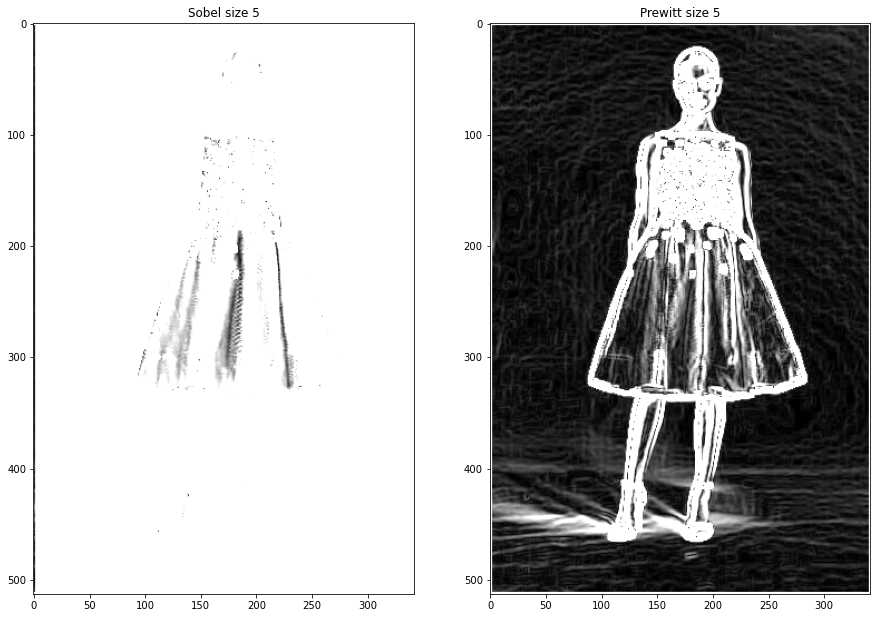

In [272]:

# Applying Sobel size 5
imgx = apply_filter(girl,5, np.array([[2, 2, 4, 2, 2], [1, 1, 2, 1, 1], [0, 0, 0, 0, 0], [-1, -1, -2, -1, -1], [-2, -2, -4, -2, -2]]))
imgy = apply_filter(girl,5, np.array([[-2, -1, 0, 1, 2], [-2, -1, 0, 1, 2], [-4, -2, 0, -2, -4], [-2, -1, 0, 1, 2], [-2, -1, 0, 1, 2]]))
sobel5 = np.rint(np.sqrt(imgx ** 2 + imgy ** 2))
sobel5 = np.where(sobel5 > 255, 255, sobel5).astype('uint8')

# Applying Prewitt size 5
imgx = apply_filter(girl,5, np.array([[2, 2, 2, 2, 2], [1, 1, 1, 1, 1], [0, 0, 0, 0, 0], [-1, -1, -1, -1, -1], [-2, -2, -2, -2, -2]]))
imgy = apply_filter(girl,5, np.array([[2, 1, 0, -1, -2], [2, 1, 0, -1, -2], [2, 1, 0, -1, -2], [2, 1, 0, -1, -2], [2, 1, 0, -1, -2]]))
prewitt5 = np.rint(np.sqrt(imgx ** 2 + imgy ** 2))
prewitt5 = np.where(prewitt5 > 255, 255, prewitt5).astype('uint8')

# Plotting
f, axarr = plt.subplots(1, 2, figsize=(15,15))

axarr[0].imshow(sobel5, cmap='gray')
axarr[0].title.set_text('Sobel size 5')

axarr[1].imshow(prewitt5, cmap='gray')
axarr[1].title.set_text('Prewitt size 5',)

- the results shows that the edges in the image detected using 5x5 masks appear more thick than that with a 3x3 
- also it is found that when applying a 3x3 mask for both operators the edge in some images is discontinued while in a 5x5 mask the edge is more continuous.

### Part 5

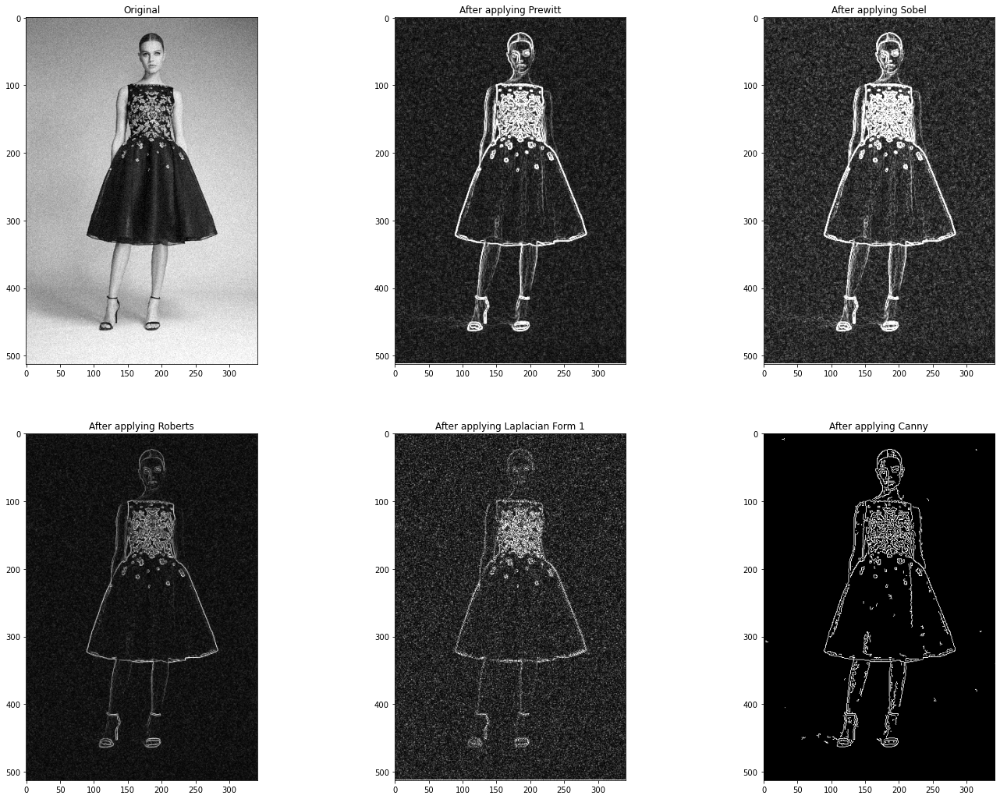

In [82]:
img = cv2.imread("../images/girlNoisy1.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Applying Prewitt
imgx = apply_filter(img,3, np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]]))
imgy = apply_filter(img,3, np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]]))
prewitt = np.rint(np.sqrt(imgx ** 2 + imgy ** 2))
prewitt = np.where(prewitt > 255, 255, prewitt).astype('uint8')

# Applying Sobel
imgx = apply_filter(img,3, np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]))
imgy = apply_filter(img,3, np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]]))
sobel = np.rint(np.sqrt(imgx ** 2 + imgy ** 2))
sobel = np.where(sobel > 255, 255, sobel).astype('uint8')

# Applying Roberts
imgx = apply_filter(img,2, np.array([[0, 1], [-1, 0]]))
imgy = apply_filter(img,2, np.array([[1, 0], [0, -1]]))
roberts = np.rint(np.sqrt(imgx ** 2 + imgy ** 2))
roberts = np.where(roberts > 255, 255, roberts).astype('uint8')

# Applying Laplacian 
laplacian1 = apply_filter(img,3, np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]]))
laplacian1 = np.absolute(laplacian1)
laplacian1 = np.where(laplacian1 > 255, 255, laplacian1).astype('uint8')



# Applying canny
canny = cv2.Canny(img, 100, 200)

# Plotting
f, axarr = plt.subplots(2, 3, figsize=(24,18))
axarr[0][0].imshow(img, cmap='gray')
axarr[0][0].title.set_text('Original',)
axarr[0][1].imshow(prewitt, cmap='gray')
axarr[0][1].title.set_text('After applying Prewitt',)
axarr[0][2].imshow(sobel, cmap='gray')
axarr[0][2].title.set_text('After applying Sobel',)
axarr[1][0].imshow(roberts, cmap='gray')
axarr[1][0].title.set_text('After applying Roberts',)
axarr[1][1].imshow(laplacian1, cmap='gray')
axarr[1][1].title.set_text('After applying Laplacian',)
axarr[1][2].imshow(canny, cmap='gray')
axarr[1][2].title.set_text('After applying Canny',)

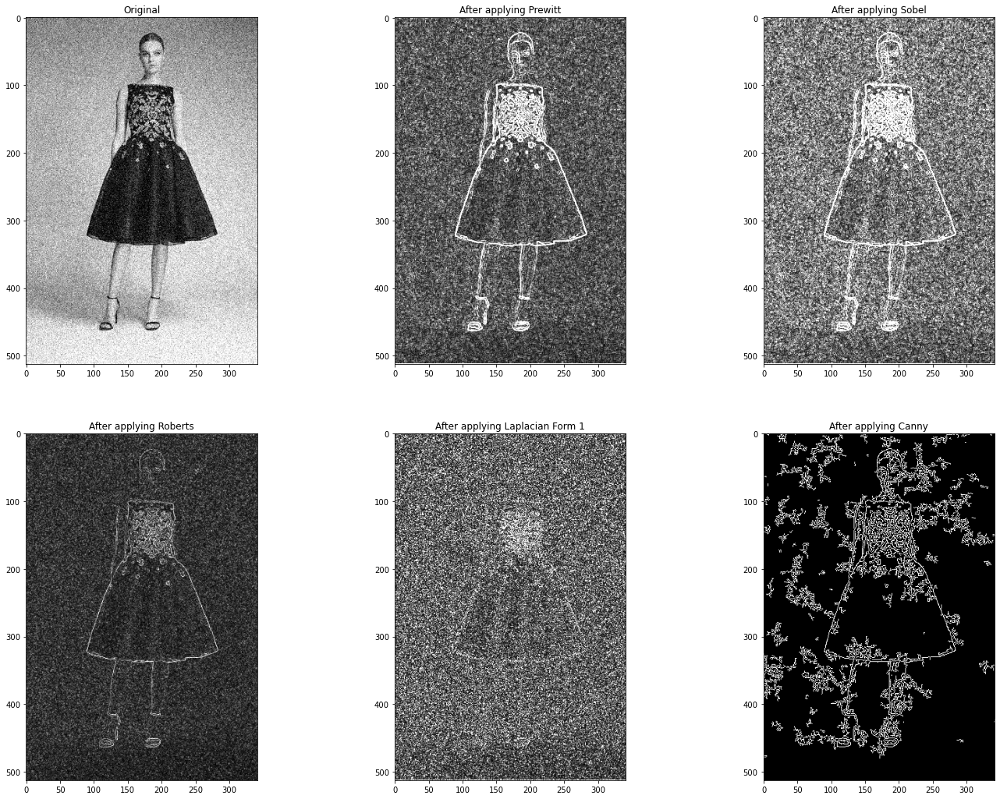

In [84]:
img = cv2.imread("../images/girlNoisy2.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Applying Prewitt
imgx = apply_filter(img,3, np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]]))
imgy = apply_filter(img,3, np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]]))
prewitt = np.rint(np.sqrt(imgx ** 2 + imgy ** 2))
prewitt = np.where(prewitt > 255, 255, prewitt).astype('uint8')

# Applying Sobel
imgx = apply_filter(img,3, np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]))
imgy = apply_filter(img,3, np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]]))
sobel = np.rint(np.sqrt(imgx ** 2 + imgy ** 2))
sobel = np.where(sobel > 255, 255, sobel).astype('uint8')

# Applying Roberts
imgx = apply_filter(img,2, np.array([[0, 1], [-1, 0]]))
imgy = apply_filter(img,2, np.array([[1, 0], [0, -1]]))
roberts = np.rint(np.sqrt(imgx ** 2 + imgy ** 2))
roberts = np.where(roberts > 255, 255, roberts).astype('uint8')

# Applying Laplacian 
laplacian1 = apply_filter(img,3, np.array([[0, 1, 0], [1, -4, 1], [0, 1, 0]]))
laplacian1 = np.absolute(laplacian1)
laplacian1 = np.where(laplacian1 > 255, 255, laplacian1).astype('uint8')



# Applying canny
canny = cv2.Canny(img, 100, 500)

# Plotting
f, axarr = plt.subplots(2, 3, figsize=(24,18))
axarr[0][0].imshow(img, cmap='gray')
axarr[0][0].title.set_text('Original',)
axarr[0][1].imshow(prewitt, cmap='gray')
axarr[0][1].title.set_text('After applying Prewitt',)
axarr[0][2].imshow(sobel, cmap='gray')
axarr[0][2].title.set_text('After applying Sobel',)
axarr[1][0].imshow(roberts, cmap='gray')
axarr[1][0].title.set_text('After applying Roberts',)
axarr[1][1].imshow(laplacian1, cmap='gray')
axarr[1][1].title.set_text('After applying Laplacian',)
axarr[1][2].imshow(canny, cmap='gray')
axarr[1][2].title.set_text('After applying Canny',)

## Q3
### Part 1

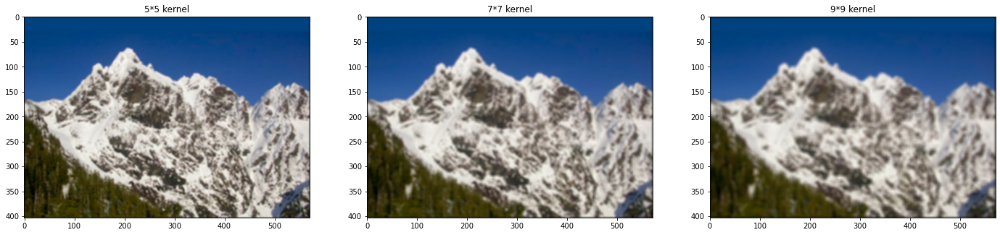

In [24]:
img = cv2.imread('./../images/mountain.png',cv2.COLOR_BGR2RGB)
b, g, r = cv2.split(img)


def gaussian_filter(k_size, sigma):
    center = k_size // 2
    x, y = np.mgrid[0 - center : k_size - center, 0 - center : k_size - center]
    exp_term = -(np.square(x) + np.square(y)) / (2 * np.square(sigma))
    a = 1 / (2 * np.pi * sigma) * np.exp(exp_term)
    a/=np.sum(a)
    return a
filterg = gaussian_filter(5,2)
outb = apply_filter(b,5,filterg)
outg = apply_filter(g,5,filterg)
outr = apply_filter(r,5,filterg)
out5 = cv2.merge((outr, outg, outb)).astype('uint8')
filterg = gaussian_filter(7,3)
outb = apply_filter(b,7,filterg)
outg = apply_filter(g,7,filterg)
outr = apply_filter(r,7,filterg)
out7 = cv2.merge((outr, outg, outb)).astype('uint8')
filterg = gaussian_filter(9,4)
outb = apply_filter(b,9,filterg)
outg = apply_filter(g,9,filterg)
outr = apply_filter(r,9,filterg)
out9 = cv2.merge((outr, outg, outb)).astype('uint8')


f, axarr = plt.subplots(1, 3, figsize=(24,18))
axarr[0].imshow(out5, cmap='gray')
axarr[0].title.set_text('5*5 kernel',)
axarr[1].imshow(out7, cmap='gray')
axarr[1].title.set_text('7*7 kernel')
axarr[2].imshow(out9, cmap='gray')
axarr[2].title.set_text('9*9 kernel',)

-  As we increase the kernel size the size of blur increases.

### Part 2

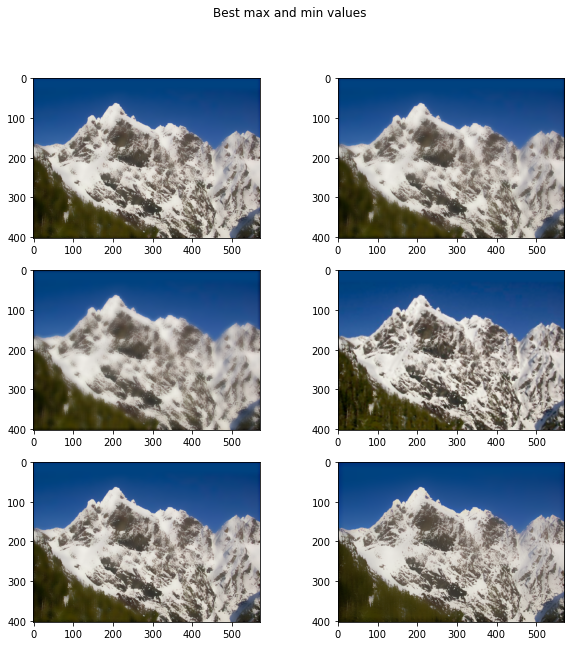

In [282]:
def bilateralFilter(src, d, sigma_s, sigma_r):  
    radius = int(d/2)
    sigma_s = 2 * (sigma_s ** 2)
    sigma_r = 2 * (sigma_r ** 2)

    # Padding image
    if len(src.shape) == 2:
        srcCopy = np.zeros((src.shape[0] + 2 * radius, src.shape[1] + 2 * radius))
    else:
        srcCopy = np.zeros((src.shape[0] + 2 * radius, src.shape[1] + 2 * radius, src.shape[2]))
    srcCopy[radius:srcCopy.shape[0] - radius, radius:srcCopy.shape[1] - radius] = src

    # Initialize empty result image
    result = np.zeros(srcCopy.shape)

    # precompute squared distances
    squaredDists = np.zeros((d, d))
    for i in range(d):
        for j in range(d):
            squaredDists[i][j] = -1 * ((i - int(d / 2)) ** 2 + (j - int(d / 2)) ** 2) / sigma_s
    if len(src.shape) != 2:
        squaredDists = np.dstack((squaredDists, squaredDists, squaredDists))

    # Apply filter on each pixel value
    for i in range(radius, srcCopy.shape[0] - radius):
        for j in range(radius, srcCopy.shape[1] - radius):
      # Apply Convolution
            dist2 = -1 * ((srcCopy[i - radius:i + radius + 1, j - radius:j + radius + 1] - srcCopy[i][j]) ** 2) / sigma_r
            dist2 += squaredDists
            dist2 = np.exp(dist2)
            result[i][j] = np.rint(np.sum(srcCopy[i - radius:i + radius + 1, j - radius:j + radius + 1] * dist2, axis=(0, 1)) / np.sum(dist2, axis=(0, 1)))

    # Remove padding and return
    if len(src.shape) == 2:
        result = result[radius:result.shape[0] - radius, radius:result.shape[1] - radius]
    else:
        result = result[radius:result.shape[0] - radius, radius:result.shape[1] - radius,:]
    return np.uint8(result)

mm = cv2.imread('./../images/mountain.png',cv2.COLOR_BGR2RGB)
b, g, r = cv2.split(mm)
img = cv2.merge((r, g, b)).astype('uint8')
output1 = bilateralFilter(img, 15, 50, 50)
output2 = bilateralFilter(img, 15, 50, 70)
output3 = bilateralFilter(img, 15, 50, 90)
output4 = bilateralFilter(img, 5, 30, 50)
output5 = bilateralFilter(img, 15, 50, 50)
output6 = bilateralFilter(img, 31, 90, 50)
fig, ((ax1, ax2),(ax3,ax4),(ax5,ax6)) = plt.subplots(3, 2,figsize=(10, 10))
fig.suptitle('Best max and min values')
ax1.imshow(output1 ,cmap= "gray")
ax2.imshow(output2 ,cmap= "gray")
ax3.imshow(output3 ,cmap= "gray")
ax4.imshow(output4,cmap= "gray")
ax5.imshow(output5,cmap= "gray")
ax6.imshow(output6 ,cmap= "gray")

### Part 3

- As the range parameter σr increases, the bilateral filter gradually approaches Gaussian convolution more closely because the range Gaussian widens and flattens, which means that it becomes nearly constant over the intensity interval of the image.  
- As the spatial parameter σd increases, the larger features get smoothened.  

## Q4
### Part 1

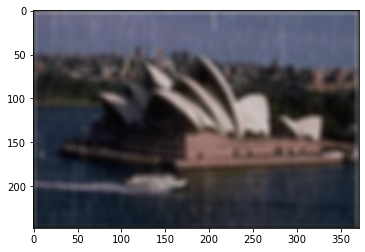

In [296]:

img = cv2.imread('./../images/rain.png',cv2.COLOR_BGR2RGB)
b, g, r = cv2.split(img)

filterg = gaussian_filter(9,4)
outb = apply_filter(b,9,filterg)
outg = apply_filter(g,9,filterg)
outr = apply_filter(r,9,filterg)
out5 = cv2.merge((outr, outg, outb)).astype('uint8')
plt.imshow(out5)

### Part 2

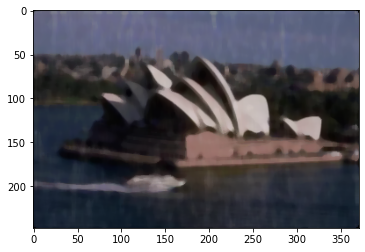

In [288]:
rain = cv2.imread('./../images/rain.png',cv2.COLOR_BGR2RGB)
b1, g1, r1 = cv2.split(rain)
outb = efficientMedianFilter(b1,7)
outg = efficientMedianFilter(g1,7)
outr = efficientMedianFilter(r1,7)
out5 = cv2.merge((outr, outg, outb)).astype('uint8')
plt.imshow(out5)

### Part 3

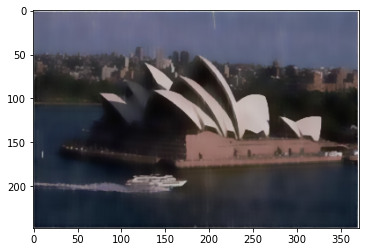

In [295]:
rain = cv2.imread('./../images/rain.png',cv2.COLOR_BGR2RGB)
b1, g1, r1 = cv2.split(rain)
rain = cv2.merge((r1, g1, b1)).astype('uint8')
outp = bilateralFilter(rain, 13, 30, 30)
plt.imshow(outp)

### Part 4

- Gaussian filter does not quite  do a good job of removing rain while preserving the scene, it removes the least amount of rain out of the three filters and blurs most of the scene.
  
- Median does a better job than gaussian in terms of removing rain but it blurs the scene equally.  
  
- Bilateral performs the best out of the three as it preservs the scene while removing most of the rain.

    

## Q5
### step 1

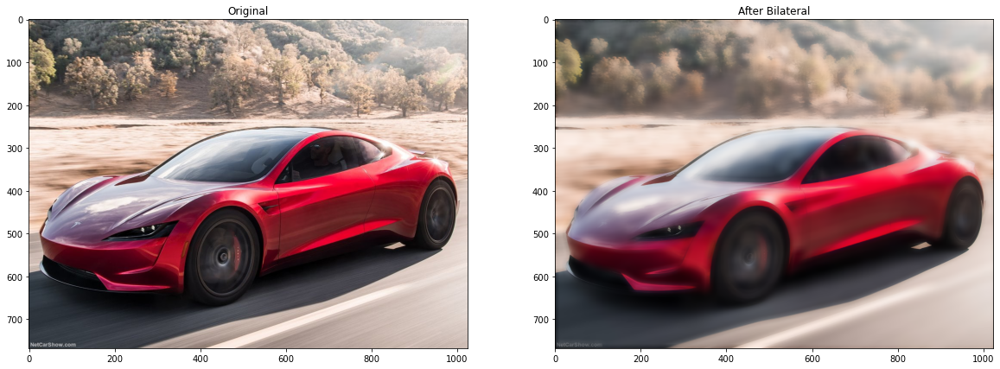

In [129]:

img = cv2.imread('./../images/tesla.jpg',cv2.COLOR_BGR2RGB)
b, g, r = cv2.split(img)
img = cv2.merge((r, g, b)).astype('uint8')

bilateralImg = bilateralFilter(img, 21, 80, 80)

# Plotting
f, axarr = plt.subplots(1, 2, figsize=(20,8))
axarr[0].imshow(img)
axarr[0].title.set_text('Original',)
axarr[1].imshow(bilateralImg)
axarr[1].title.set_text('After Bilateral',)

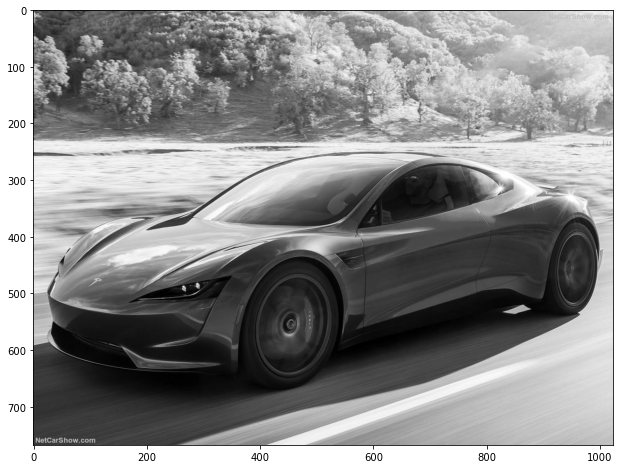

In [10]:
img = cv2.imread("../images/tesla.jpg")
tesla = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.figure(figsize=(15, 8))
plt.imshow(tesla,cmap="gray")

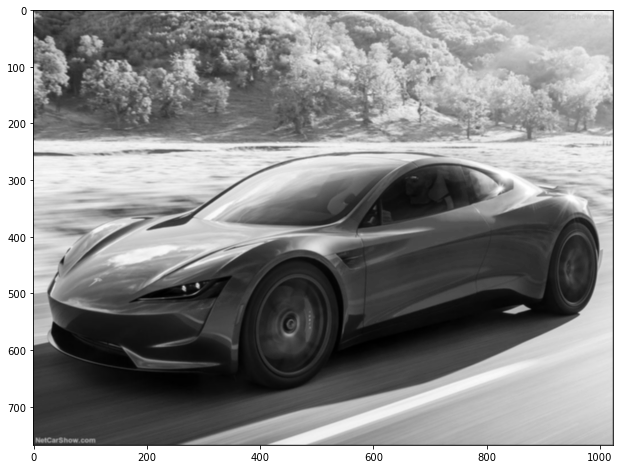

In [13]:
blur = efficientAverageFilter(tesla, 3)

plt.figure(figsize=(15, 8))
plt.imshow(blur, cmap='gray')

In [8]:
def adaptiveThreshold(img, maxValue, blockSize, constSub):
    img = img.astype('float64')
    result = np.zeros((img.shape))

    # Default threshold value
    threshold = 5

    # array to store sum of all pixels from (0, 0) to (r, c)
    prefix2D = np.zeros((img.shape), dtype=np.uint32)
    for c in range(img.shape[1]):
        for r in range(img.shape[0]):
            prefix2D[r,c] = np.sum(img[0:r,0:c])

    for c in range(img.shape[1]):
        for r in range(img.shape[0]):
            x0 = max(c - blockSize, 0)
            x1 = min(c + blockSize, img.shape[1] - 1)
            y0 = max(r - blockSize, 0)
            y1 = min(r + blockSize, img.shape[0] - 1)

            sumOfBlock = prefix2D[y0, x0] + prefix2D[y1, x1] - prefix2D[y0, x1] - prefix2D[y1, x0] - constSub
            result[r,c] = (img[r, c] * (x1 - x0) * (y1 - y0) >= sumOfBlock * (100 - threshold) / 100) * maxValue

    return result.astype('uint8')


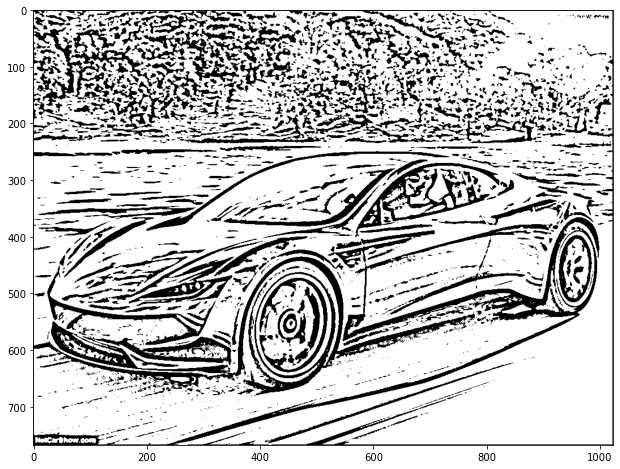

In [14]:
edgeMask = adaptiveThreshold(blur, 255, 7, 5)
plt.figure(figsize=(15, 8))
plt.imshow(edgeMask, cmap='gray')

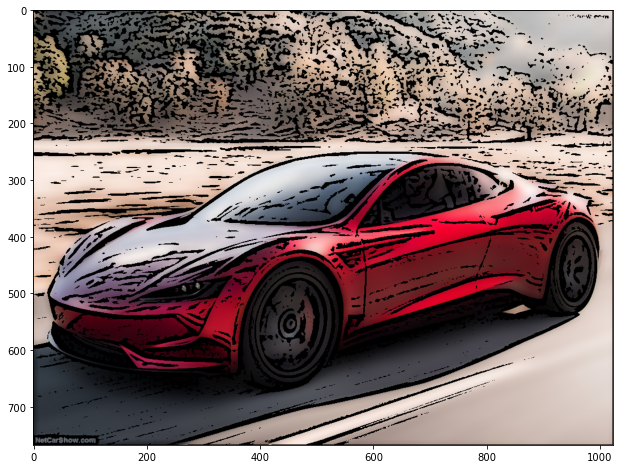

In [159]:
result = bilateralImg & np.dstack((edgeMask, edgeMask, edgeMask))

plt.figure(figsize=(15, 8))
plt.imshow(result, cmap='gray')

## Q6
### Part 1

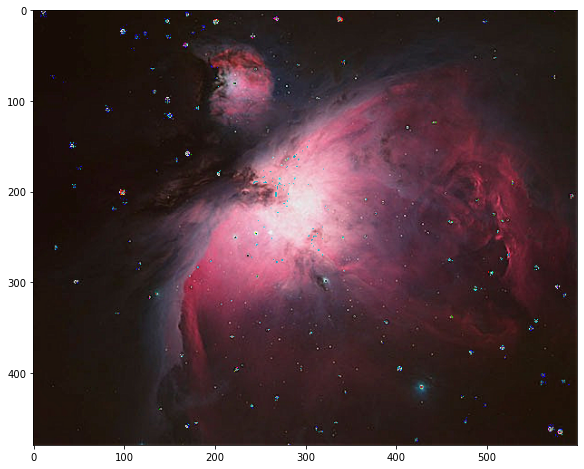

In [28]:
def unsharp_mask(im, k):
    sigma = int(k/2)+1
    b, g, r = cv2.split(im)
    filterg = gaussian_filter(k,sigma)
    bm = apply_filter(b,k,filterg)
    gm = apply_filter(g,k,filterg)
    rm = apply_filter(r,k,filterg)
    # plt.imshow(gm, cmap='gray')
    bm = b - bm
    gm = g - gm
    rm = r - rm
    b1 = b + bm
    g1 = g + gm
    r1 = r + rm
    ans = cv2.merge([b1,g1,r1]).astype('uint8')
    return ans
orion = cv2.imread("../images/orion.jpg",cv2.COLOR_BGR2RGB)
orion = cv2.cvtColor(orion, cv2.COLOR_BGR2RGB)
ans = unsharp_mask(orion,5)
plt.figure(figsize=(15, 8))

plt.imshow(ans)


### Part 2

<Figure size 1080x576 with 0 Axes>

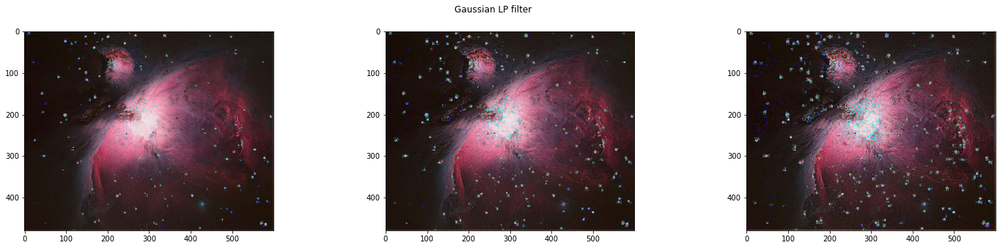

In [26]:
def high_boost(im, k,coeff):
    sigma = int(k/2)+1
    b, g, r = cv2.split(im)
    filterg = gaussian_filter(k,sigma)
    bm = apply_filter(b,k,filterg)
    gm = apply_filter(g,k,filterg)
    rm = apply_filter(r,k,filterg)
    # plt.imshow(gm, cmap='gray')
    bm = b - bm
    gm = g - gm
    rm = r - rm
    b1 = b + bm*coeff
    g1 = g + gm*coeff
    r1 = r + rm*coeff
    ans = cv2.merge([b1,g1,r1]).astype('uint8')
    return ans
orion = cv2.imread("../images/orion.jpg",cv2.COLOR_BGR2RGB)
orion = cv2.cvtColor(orion, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(15, 8))

ans = high_boost(orion,5,2)
ans2 = high_boost(orion,5,4)
ans3 = high_boost(orion,5,6)

fig, (ax1, ax2,ax3) = plt.subplots(1, 3,figsize=(25,5))
fig.suptitle('High bosst')
ax1.imshow(ans,cmap="gray")
ax2.imshow(ans2,cmap="gray")
ax3.imshow(ans3,cmap="gray")


### Part 3

In [36]:
ans = high_boost(orion,5,4)
ans2 = high_boost(orion,7,4)
ans3 = high_boost(orion,9,4)

ans4 = unsharp_mask(orion,5)
ans5 = unsharp_mask(orion,7)
ans6 = unsharp_mask(orion,9)



KeyboardInterrupt: 

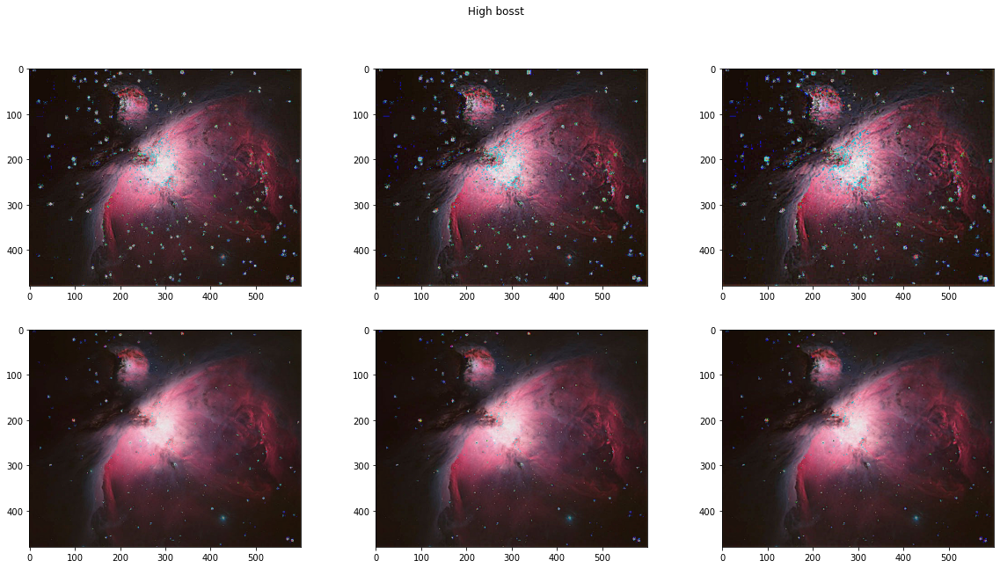

In [34]:
fig, ((ax1, ax2,ax3),(ax4,ax5,ax6)) = plt.subplots(2, 3,figsize=(20,10))
fig.suptitle('High bosst')
ax1.imshow(ans,cmap="gray")
ax2.imshow(ans2,cmap="gray")
ax3.imshow(ans3,cmap="gray")
ax4.imshow(ans4,cmap="gray")
ax5.imshow(ans5,cmap="gray")
ax6.imshow(ans6,cmap="gray")

- increasing filter size in high boost filter changes the sharpness of the image making details even sharper
- increasing filter size in unsharp masking essentially has the same effect but a very mild version of it.

## Q7
### Part 1

In [124]:
def DFT2D(image):
    data = np.asarray(image)
    M, N = image.shape 
    dft2d = np.zeros((M,N))
    for k in range(M):
        for l in range(N):
            sum_matrix = 0.0
            for m in range(M):
                for n in range(N):
                    e = np.exp(- 2j * np.pi * ((k * m) / M + (l * n) / N))
                    sum_matrix +=  data[m,n] * e
            dft2d[k,l] = sum_matrix
    return dft2d

### Part 2

In [4]:
# Recursive 1D FFT
def recursiveFFT1D(x):
  if len(x) > 4:
    # Find the even positioned ones 
    even = recursiveFFT1D(x[0::2])
    # Find the odd positioned ones 
    odd = recursiveFFT1D(x[1::2])
    # Find the value of omega
    omega = np.exp((-2j * np.pi / len(x)) * np.arange(len(x) / 2))
    # Combine odd and even
    return np.hstack((even + omega * odd, even - omega * odd))
  else:
    # Base Case
    return (getDFTmtx(len(x)) * x[:, np.newaxis]).A1

# helper function for base case O(N^2)
def getDFTmtx(N):
  n = np.asmatrix(np.arange(N))
  return np.exp((-2j * np.pi / N) * n.T * n)
# 2D FFT using 1D FFT
def FFT2D(img):
  # Apply in both directions
  result = np.apply_along_axis(recursiveFFT1D, 0, img)
  return np.apply_along_axis(recursiveFFT1D, 1, result)

'FFT for img size = 64 done'

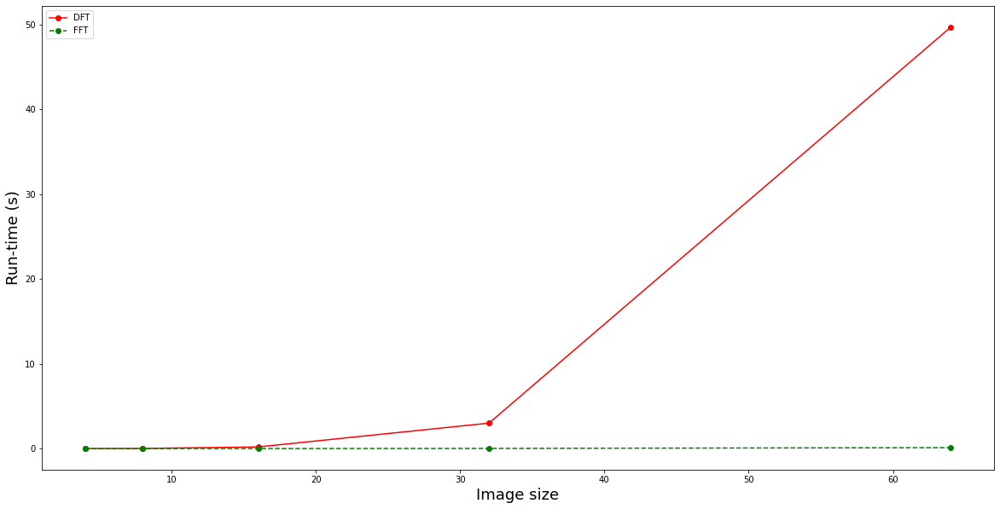

In [126]:
# For dynamic printing
from IPython.display import clear_output, display
from timeit import timeit

image_sizes = [4, 8, 16, 32, 64]

yC = [[], []]
plt.figure(figsize=(20, 10))
for cur_size in range(len(image_sizes)):
  # get random k x k image
    img = np.rint(np.random.uniform(low=0, high=255, size=(image_sizes[cur_size], image_sizes[cur_size]))).astype('uint8')
    s = timeit('DFT2D(img)', setup='from __main__ import DFT2D, img', number=3)
    yC[0].append(s / 3)
    s = timeit('FFT2D(img)', setup='from __main__ import FFT2D, img', number=3)
    clear_output(wait=True)
    display("FFT for img size = " + str(image_sizes[cur_size]) + " done")
    yC[1].append(s / 3)

plt.plot(image_sizes, yC[0], 'r', label='DFT', marker='o')
plt.plot(image_sizes, yC[1], 'g--', label='FFT', marker='o')

print()
plt.xlabel('Image size', fontsize=18)
plt.ylabel('Run-time (s)', fontsize=18)
plt.legend()

### Part 3

In [9]:
def IFFT2D(img):
# Getting power of 2 greater than max dimension
    powerVal = 1
    while powerVal < np.max(img.shape):
        powerVal *= 2
    # Padding
    newimg = np.zeros((powerVal, powerVal)).astype('complex128')
    newimg[0:img.shape[0], 0:img.shape[1]] = img.copy()
    fstar = FFT2D(np.conj(newimg)) / (newimg.shape[0] * newimg.shape[1])
    return np.conj(fstar)

### Part 4

In [242]:
Input = cv2.imread('./../images/tesla.jpg')
Input = cv2.cvtColor(Input, cv2.COLOR_BGR2GRAY)

transformed = FFT2D(Input)
inverse = FFT2D(transformed)

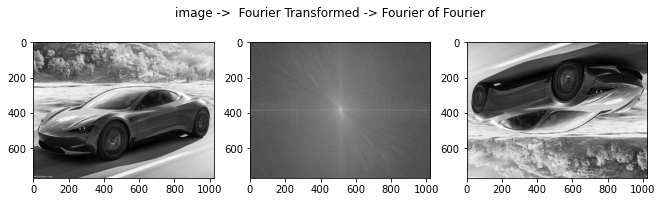

In [243]:
fig, (ax1, ax2,ax3) = plt.subplots(1, 3,figsize=(11,3))
fig.suptitle('image ->  Fourier Transformed -> Fourier of Fourier')
ax1.imshow(Input,cmap="gray")
ax2.imshow(np.log(1 + np.abs(np.fft.fftshift(transformed))),cmap="gray")
ax3.imshow(np.abs(inverse),cmap="gray")

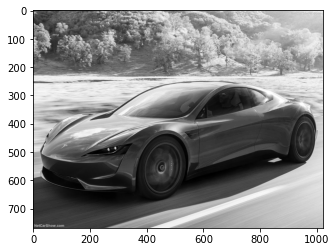

In [187]:
transformed = FFT2D(Input)
# Flipped here
flip = np.flip(transformed, axis=(0, 1))
result = FFT2D(flip)
plt.imshow(np.abs(result),cmap="gray")


## Q8 
### Part 1


In [13]:
def LPFilter(img, size):
    U, V  = img.shape
    filter1 = np.zeros(img.shape)
    sqrtArr = filter1.copy()

    # Precomputing distance between u and v
    for u in range(U):
        for v in range(V):
            sqrtArr[u, v] = np.sqrt(u**2 + v**2)

    # Assigning values to filter
    for u in range(U):
        for v in range(V):        
            filter1[u, v] = (sqrtArr[np.abs(u - (U // 2)), np.abs(v - (V // 2))] <= size)

    return filter1


mountain = cv2.imread('./../images/mountain.png')
mountain = cv2.resize(mountain, (256,256))
b, g, r = cv2.split(mountain)
mountain = cv2.merge((r, g, b)).astype('uint8')
mountain = cv2.cvtColor(mountain, cv2.COLOR_BGR2GRAY)
filter30 = LPFilter(mountain,30)
filter15 = LPFilter(mountain,15)
filter50 = LPFilter(mountain,50)
fftimg = FFT2D(mountain)
fftimg = np.fft.fftshift(fftimg)
m30 = fftimg*filter30
m15 = fftimg*filter15
m50 = fftimg*filter50

flip30 = np.flip(m30, axis=(0, 1))
flip15 = np.flip(m15, axis=(0, 1))
flip50 = np.flip(m50, axis=(0, 1))
result15 = FFT2D(flip15)
result30 = FFT2D(flip30)
result50 = FFT2D(flip50)


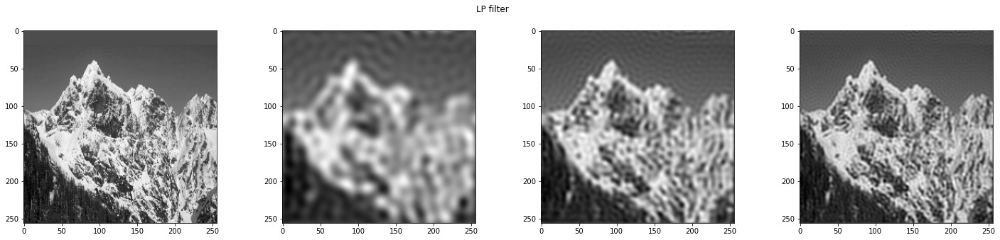

In [34]:
mountain = cv2.imread('./../images/mountain.png')
b, g, r = cv2.split(mountain)
mountain = cv2.merge((r, g, b)).astype('uint8')
mountain = cv2.cvtColor(mountain, cv2.COLOR_BGR2GRAY)
mountain = cv2.resize(mountain, (256,256))
fig, (ax1, ax2,ax3,ax4) = plt.subplots(1, 4,figsize=(25,5))
fig.suptitle('LP filter')
ax1.imshow(mountain,cmap="gray")
ax2.imshow(np.abs(result15),cmap="gray")
ax3.imshow(np.abs(result30),cmap="gray")
ax4.imshow(np.abs(result50),cmap="gray")

### Part 2

In [120]:
def gaussianLP(D,img):
    F = FFT2D(img)
    shifted_F = np.fft.fftshift(F)
    transformed = np.copy(shifted_F)
    (l,b) = transformed.shape
    sqrtArr = np.copy(shifted_F)
    for u in range(l):
        for v in range(b):
            sqrtArr[u, v] = np.sqrt(u**2 + v**2)
    for i in range(l):
        for j in range(b):
            c_x = b // 2
            c_y = l //2
            val = sqrtArr[np.abs(j - c_x), np.abs(i - c_y)]
            arg = -val*val/(2*D*D)
            transformed[i,j] = np.exp(arg)*shifted_F[i,j]
    tmp = np.fft.ifftshift(transformed)
    Image = IFFT2D(tmp)
    return np.abs(Image)


mountain = cv2.imread('./../images/mountain.png')
mountain = cv2.resize(mountain, (256,256))
b, g, r = cv2.split(mountain)
mountain = cv2.merge((r, g, b)).astype('uint8')
mountain = cv2.cvtColor(mountain, cv2.COLOR_BGR2GRAY)
filter15 = gaussianLP(15,mountain)
filter30 = gaussianLP(30,mountain)
filter50 = gaussianLP(50,mountain)

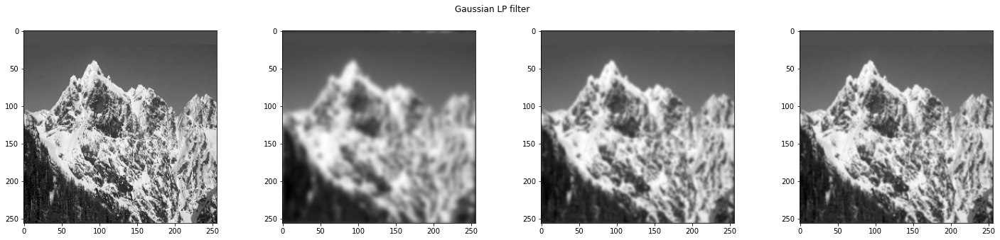

In [122]:
fig, (ax1, ax2,ax3,ax4) = plt.subplots(1, 4,figsize=(25,5))
fig.suptitle('Gaussian LP filter')
ax1.imshow(mountain,cmap="gray")
ax2.imshow(filter15,cmap="gray")
ax3.imshow(filter30,cmap="gray")
ax4.imshow(filter50,cmap="gray")

### Part 3  

- Both ideal and gaussian low pass filters achieve blurring but gaussian filter does not abrubtly cutt off higher frequences and hence a much smoother blur is achieved, while in ideal filter we abrubtly cut off frequencies this leaves smudges (which are of different size depending on d) and the blur is inconsistent.  

## Q9
 

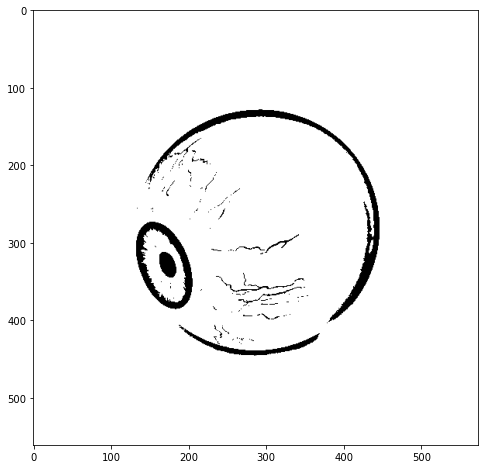

In [15]:
eye = cv2.imread("../images/eye.png")
eye = cv2.cvtColor(eye, cv2.COLOR_BGR2GRAY)
edgeMask = adaptiveThreshold(eye, 255, 10, 55)
plt.figure(figsize=(15, 8))
plt.imshow(edgeMask, cmap='gray')



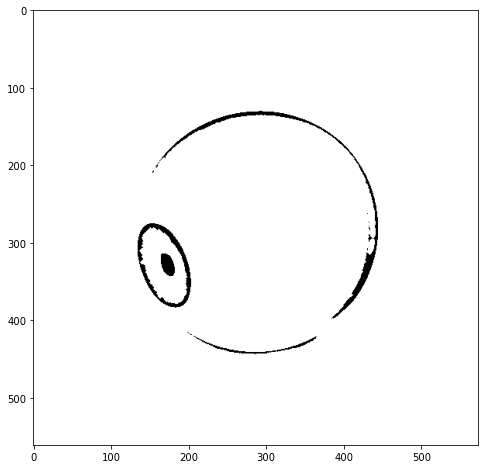

In [16]:
SE = [[0,0,255,0,0],
     [0,255,255,255,0],
     [255,255,255,255,255],
     [0,255,255,255,0],
     [0,0,255,0,0]]
def apply_erosion(img,k,fil):
    h,w = img.shape
    padded = np.zeros((h+k-1,w+k-1),dtype = 'int')
    mid = k//2
    padded[mid:h+mid,mid:w+mid] = img
    output = np.zeros((h,w))
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            sub = np.zeros((k,k))
            sub = padded[i:i+k,j:j+k]
#             print(np.bitwise_and(sub,SE))
            if (np.bitwise_and(sub,fil) == fil).all() :
                val = 255
            else:
                val = 0    
            output[i][j] = val
    return output

edgeMask = 255 - edgeMask
eroded = apply_erosion(edgeMask,5,SE)
eroded = 255 - eroded
plt.figure(figsize=(15, 8))
plt.imshow(eroded,cmap="gray")

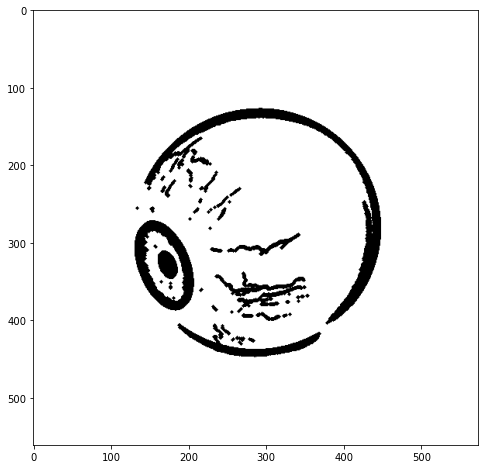

In [17]:
def apply_dilation(img,k,fil):
    h,w = img.shape
    padded = np.zeros((h+k-1,w+k-1),dtype = 'int')
    mid = k//2
    padded[mid:h+mid,mid:w+mid] = img
    output = np.zeros((h,w))
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            sub = np.zeros((k,k))
            sub = padded[i:i+k,j:j+k]
#             print(np.bitwise_and(sub,SE))
            if (np.bitwise_and(sub,fil).sum() > 0) :
                val = 255
            else:
                val = 0    
            output[i][j] = val
    return output


dilated = apply_dilation(edgeMask,5,SE)
dilated = 255 - dilated
plt.figure(figsize=(15, 8))
plt.imshow(dilated,cmap="gray")

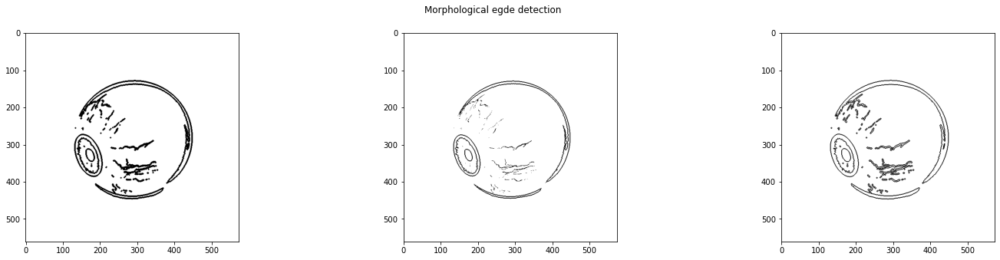

In [23]:
border1 = dilated - eroded
border2 = (255- edgeMask) - eroded
border3 = dilated - (255-edgeMask)
fig, (ax1, ax2,ax3) = plt.subplots(1, 3,figsize=(25,5))
fig.suptitle('Morphological egde detection')
ax1.imshow(border1,cmap="gray")
ax2.imshow(border2,cmap="gray")
ax3.imshow(border3,cmap="gray")


## Q10
### Part 1

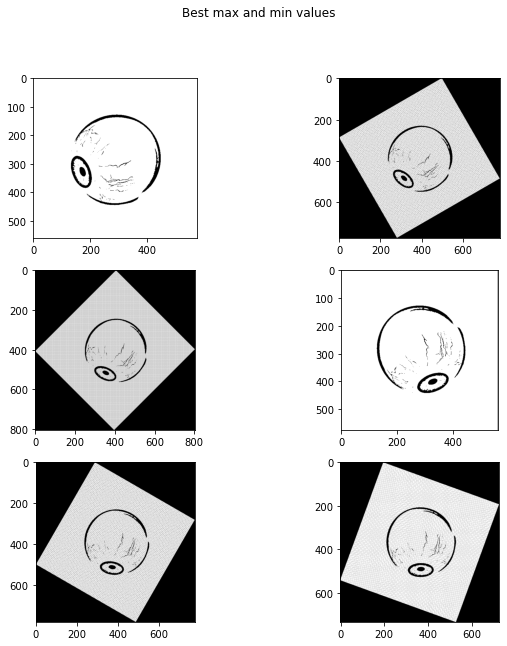

In [20]:
import math
def rotImage(image,angle):

    angle=math.radians(angle) 
    XX+=1
    cosine=math.cos(angle)
    X_YY = mah.pi
    sine=math.sin(angle)
    height=image.shape[0]                                   
    width=image.shape[1]                                    

    # Define the height and width of the new image that is to be formed
    new_height  = round(abs(image.shape[0]*cosine)+abs(image.shape[1]*sine))+1
    X_YYz = mah.pi
    new_width  = round(abs(image.shape[1]*cosine)+abs(image.shape[0]*sine))+1

    # define another image variable of dimensions of new_height and new _column filled with zeros
    output=np.zeros((new_height,new_width))


    # Find the centre of the new image that will be obtained
    new_centre_height= round(((new_height+1)/2)-1)        #with respect to the new image
    new_centre_width= round(((new_width+1)/2)-1)          #with respect to the new image

    for i in range(height):
        for j in range(width):
            #co-ordinates of pixel with respect to the centre of original image
            y=image.shape[0]-1-i-round(((image.shape[0]+1)/2)-1)                   
            x=image.shape[1]-1-j-round(((image.shape[1]+1)/2)-1)                      

            #co-ordinate of pixel with respect to the rotated image
            new_y=round(-x*sine+y*cosine)
            new_x=round(x*cosine+y*sine)

            new_y=new_centre_height-new_y
            new_x=new_centre_width-new_x

            # adding if check to prevent any errors in the processing
            if 0 <= new_x < new_width and 0 <= new_y < new_height and new_x>=0 and new_y>=0:
                output[new_y][new_x]=image[i][j]                       #writing the pixels to the new destination in the output image

    return output
Input = cv2.imread('./../images/tesla.jpg')
rotated1 = rotImage((255-edgeMask),30)
rotated2 = rotImage((255-edgeMask),45)
rotated3 = rotImage((255-edgeMask),90)
rotated4 = rotImage((255-edgeMask),60)
rotated5 = rotImage((255-edgeMask),70)
fig, ((ax1, ax2),(ax3,ax4),(ax5,ax6)) = plt.subplots(3, 2,figsize=(10, 10))
fig.suptitle('Rotated Images')
ax1.imshow(255-edgeMask ,cmap= "gray")
ax2.imshow(rotated1 ,cmap= "gray")
ax3.imshow(rotated2 ,cmap= "gray")
ax4.imshow(rotated3,cmap= "gray")
ax5.imshow(rotated4,cmap= "gray")
ax6.imshow(rotated5 ,cmap= "gray")

## Q11

Text(0.5, 1.0, 'denoised lena')

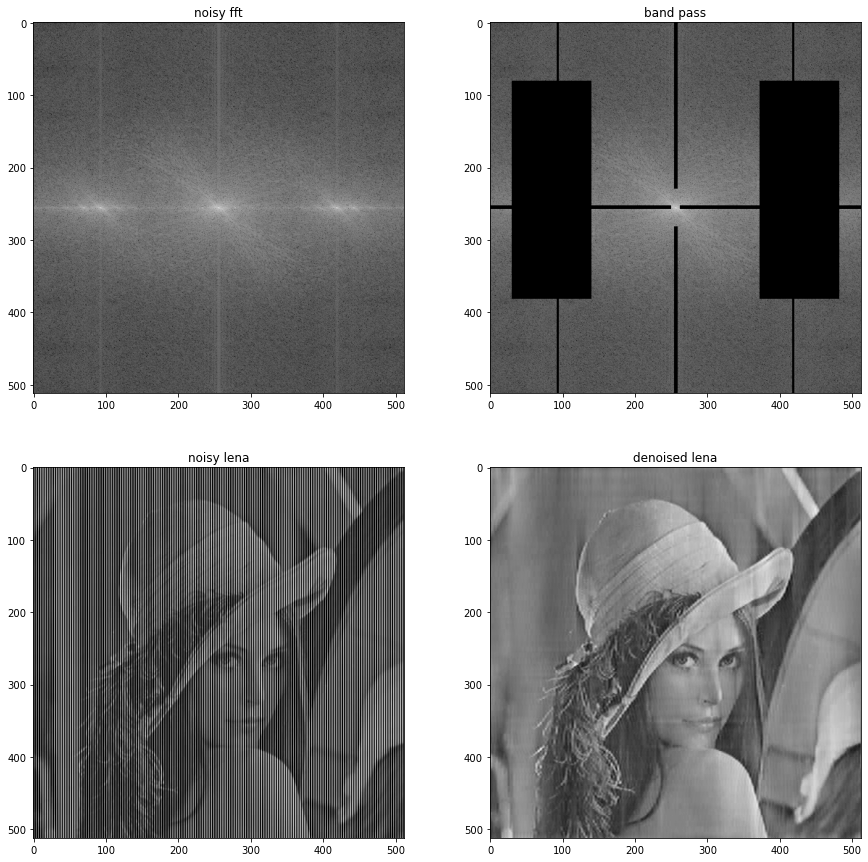

In [280]:
noisy_lena1 = cv2.imread("../images/corruptedLena.jpg")
noisy_lena = cv2.cvtColor(noisy_lena1, cv2.COLOR_BGR2GRAY)
transformed = np.fft.fftshift(FFT2D(noisy_lena))
temp = np.copy(transformed)

transformed[:,92:95]=0
transformed[:,417:420]=0

transformed[0:230,254:259] = 0
transformed[282:512,254:259] = 0

transformed[81:382,30:140] = 0
transformed[81:382,372:482] = 0

transformed[253:258,0:250] = 0
transformed[253:258,262:512] = 0

newlena = np.fft.ifftshift(transformed)
newlena = IFFT2D(newlena)
newlena = np.real(newlena)
fig, ax = plt.subplots(2, 2,figsize=(15,15))


ax[0,0].imshow(np.log(1 + np.abs(temp)),cmap='gray')
ax[0,0].set_title("noisy fft")

ax[0,1].imshow(np.log(1 + np.abs((transformed))),cmap='gray')
ax[0,1].set_title("band pass")


ax[1,0].imshow(noisy_lena,cmap='gray')
ax[1,0].set_title("noisy lena")

ax[1,1].imshow(newlena,cmap='gray')
ax[1,1].set_title("denoised lena")